In [26]:
include("/Users/meesvandartel/Desktop/Coursework/CGT/DeepEWA/FastEWA.jl")
using Flux, .fEWA, Random, IterTools, ProgressMeter, DataFrames, CSV, Statistics

In [27]:
# this data will be for this specific coordination game with 2 NE and 1 mixed NE.
coord = [[[5 1; 1 4], [5 1; 1 4]], fEWA.find_NE_mixed([[5 1; 1 4], [5 1; 1 4]])]
points = 10000 

α_grid = rand(0.0:0.0001:1.0, points) 
κ_grid = rand(0.0:0.0001:1.0, points)
δ_grid = rand(0.0:0.0001:1.0, points)
β_grid = exp.(rand(0.0:0.001:4.0, points)) # take exp to get the lim to infty effect since β is unbounded above
combs = [[α_grid[i], κ_grid[i], δ_grid[i], β_grid[i]] for i in 1:points]
subset=Int64(floor(0.6*length(combs))) #60/40 train test split, since we have many obs

x_train, x_test = combs[1:subset], combs[(subset+1):end]
y_train, y_test = Vector{Bool}(undef, length(x_train)),Vector{Bool}(undef, length(x_test))
println("Finished")

Finished


In [28]:
# should take about 6min for 1mil obs
@showprogress for i in 1:length(x_train)
    comb=x_train[i]
    α, κ, δ, β = comb
    params = fEWA.init_EWA(;α=α, κ=κ, δ=δ, β=β,game=coord)
    sₜ, σ, Qₜ, NE_found  = fEWA.Run_FastEWA(params)
    y_train[i] = NE_found
end

@showprogress for i in 1:length(x_test)
    comb = x_test[i]
    α, κ, δ, β = comb
    params = fEWA.init_EWA(;α=α, κ=κ, δ=δ, β=β,game=coord)
    _, _, _, NE_found  = fEWA.Run_FastEWA(params)
    y_test[i] = NE_found
end

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
Progress: 100%|█████████████████████████████████████████| Time: 0:00:00


In [29]:
x_train = hcat([x[1:4] for x in x_train]...)

DeepEWA= Chain(
    Dense(4 => 6, relu),
    Dense(6 => 6, relu),
    Dense(6 => 2))

out1 = DeepEWA(x_train)
probs1 = softmax(out1)


target = Flux.onehotbatch(y_train, [true, false])
loader = Flux.DataLoader((x_train, target), batchsize=64, shuffle=true);

opt_state = Flux.setup(Flux.Adam(0.01), DeepEWA)

losses=[]
@showprogress for epoch in 1:1000
    for xy in loader
        x,y = xy
        loss, grads = Flux.withgradient(DeepEWA) do m
            y_hat = m(x)
            Flux.logitcrossentropy(y_hat, y)
        end
        Flux.update!(opt_state, DeepEWA, grads[1])
        push!(losses, loss)
    end
end

opt_state

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


(layers = ((weight = Leaf(Adam(eta=0.01, beta=(0.9, 0.999), epsilon=1.0e-8), (Float32[0.00145805 0.00630632 0.00584536 0.0268267; 0.0 0.0 0.0 0.0; … ; 0.000303183 0.0023615 -0.00103248 0.0579764; 0.0 0.0 0.0 0.0], Float32[0.000530789 0.000517957 0.000786262 0.0189383; 0.0 0.0 0.0 0.0; … ; 0.000405229 0.000428041 0.00025572 0.270624; 0.0 0.0 0.0 0.0], (6.0f-45, 1.4327f-41))), bias = Leaf(Adam(eta=0.01, beta=(0.9, 0.999), epsilon=1.0e-8), (Float32[0.00618651, 0.0, 4.25833f-5, -0.010228, 0.00153198, 0.0], Float32[0.00156823, 0.0, 0.000194767, 0.000830857, 0.00119024, 0.0], (6.0f-45, 1.4327f-41))), σ = ()), (weight = Leaf(Adam(eta=0.01, beta=(0.9, 0.999), epsilon=1.0e-8), (Float32[-0.000172973 0.0 … -0.000398677 0.0; 0.0 0.0 … 6.0f-45 0.0; … ; 0.00145706 0.0 … -0.00803753 0.0; -6.0f-45 0.0 … 6.0f-45 0.0], Float32[1.37576f-5 0.0 … 3.13996f-6 0.0; 0.0 0.0 … 7.0f-43 0.0; … ; 0.000722444 0.0 … 0.00131447 0.0; 1.74506f-37 0.0 … 5.37244f-35 0.0], (6.0f-45, 1.4327f-41))), bias = Leaf(Adam(eta=0.0

In [30]:
out2 = DeepEWA(x_train)
probs2 = softmax(out2)
mean((probs2[1,:].>0.5).==y_train)

0.7281666666666666

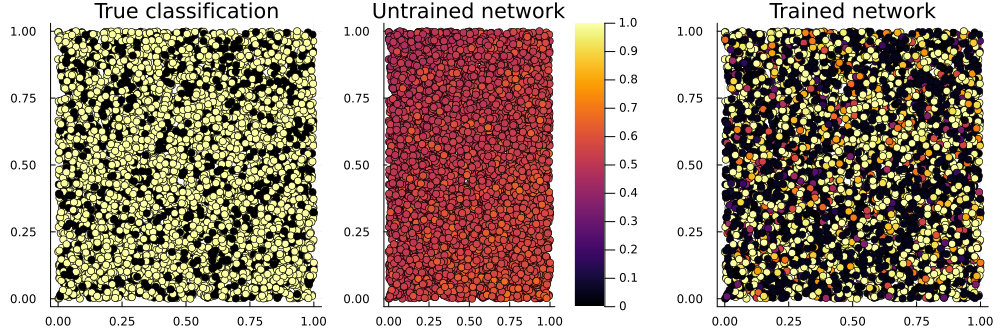

In [31]:
using Plots  # to draw the above figure

p_true = scatter(x_train[1,:], x_train[2,:], zcolor=y_train, title="True classification", legend=false)
p_raw =  scatter(x_train[1,:], x_train[2,:], zcolor=probs1[1,:], title="Untrained network", label="", clims=(0,1))
p_done = scatter(x_train[1,:], x_train[2,:], zcolor=probs2[1,:], title="Trained network", legend=false)

plot(p_true, p_raw, p_done, layout=(1,3), size=(1000,330))


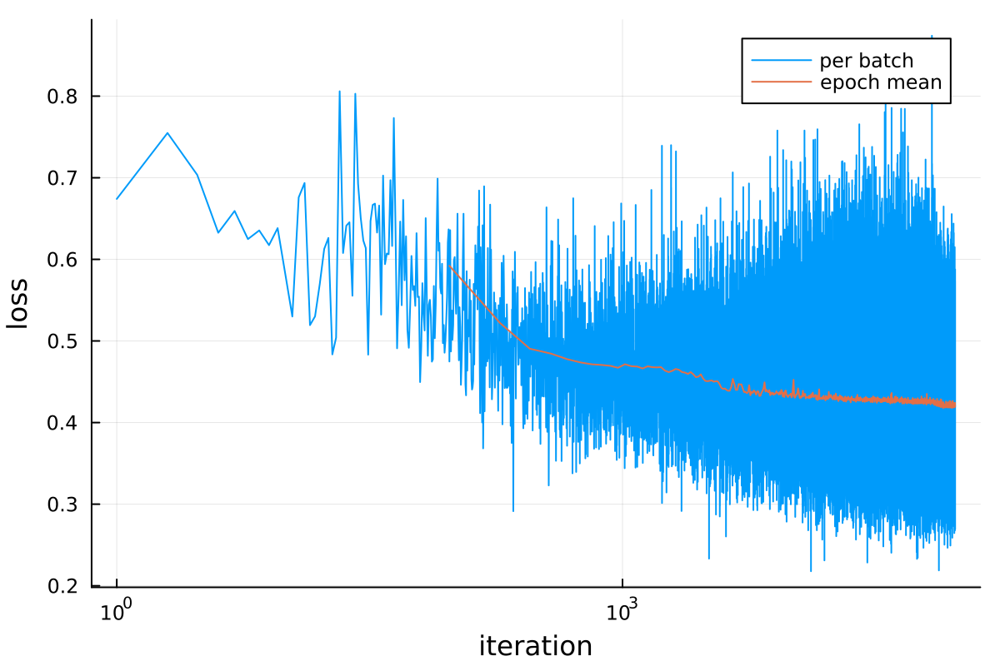

In [32]:
plot(losses; xaxis=(:log10, "iteration"),
    yaxis="loss", label="per batch")
n = length(loader)
plot!(n:n:length(losses), mean.(Iterators.partition(losses, n)),
    label="epoch mean", dpi=200)
